In [1]:
import numpy as np
import pandas as pd
import os
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import random
import scipy.stats
from scipy.stats import kstest

In [2]:
df=pd.read_csv('cardio_train.csv',sep=";")

### Убираем дубликаты убрав id

In [3]:
df.drop(columns=['id'], inplace=True)
duplicate_sum = df.duplicated().sum()
if duplicate_sum:
    print('Duplicates Rows in Dataset are : {}'.format(duplicate_sum))
else:
    print('Dataset contains no Duplicate Values')

Duplicates Rows in Dataset are : 24


In [4]:
duplicated = df[df.duplicated(keep=False)]
duplicated = duplicated.sort_values(by=['gender', 'height', 'weight'], ascending= False)
duplicated.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
10494,16937,2,170,70.0,120,80,1,1,0,0,0,0
44653,16937,2,170,70.0,120,80,1,1,0,0,0,0
1142,17493,2,169,74.0,120,80,1,1,0,0,1,1
50432,17493,2,169,74.0,120,80,1,1,0,0,1,1
32683,17535,2,165,65.0,120,80,1,1,0,0,1,0


In [5]:
df.drop_duplicates(keep = 'first', inplace = True)
print('Total {} datapoints remaining with {} features'.format(df.shape[0], df.shape[1]))

Total 69976 datapoints remaining with 12 features


In [6]:
fig = go.Figure()

fig.add_trace(go.Box(x=df['height'], name = 'Height', boxpoints='outliers',))
fig.add_trace(go.Box(x=df['weight'], name = 'Weight', boxpoints='outliers',))

fig.update_layout(title_text="Box Plot для веса и роста с выбросами")
fig.show()

In [7]:
fig = make_subplots(rows=1, cols=2, subplot_titles=("Распределение Роста", "Распределение Веса"))

trace0 = go.Histogram(x=df['height'], name = 'Рост')
trace1 = go.Histogram(x=df['weight'], name = 'Вес')


fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)

fig.update_xaxes(title_text="Рост", row=1, col=1)
fig.update_yaxes(title_text="Количество", row=1, col=1)

fig.update_xaxes(title_text="Вес", row=1, col=2)
fig.update_yaxes(title_text="Количество", row=1, col=2)

fig.update_layout(title_text="Гистограммы", height=700)


fig.show()

In [8]:
def outliers(df_out, drop = False):
    for each_feature in df_out.columns:
        feature_data = df_out[each_feature]
        Q1 = np.percentile(feature_data, 25.) # 25th percentile of the data of the given feature
        Q3 = np.percentile(feature_data, 75.) # 75th percentile of the data of the given feature
        IQR = Q3-Q1 #Interquartile Range
        outlier_step = IQR * 1.5 # допустимое расстояние 
        outliers = feature_data[~((feature_data >= Q1 - outlier_step) & (feature_data <= Q3 + outlier_step))].index.tolist()  
        print('For the feature {}, No of Outliers is {}'.format(each_feature, len(outliers)))
outliers(df[['height', 'weight']])

For the feature height, No of Outliers is 519
For the feature weight, No of Outliers is 1819


In [9]:
outline_free_df = df.copy()
outline_free_df[['height', 'weight']] = np.log(outline_free_df[['height', 'weight']])
outliers(outline_free_df[['height', 'weight']])

For the feature height, No of Outliers is 484
For the feature weight, No of Outliers is 1174


In [10]:
outline_free_df = outline_free_df[(outline_free_df['weight'] > outline_free_df['weight'].quantile(0.005)) & (outline_free_df['weight'] < outline_free_df['weight'].quantile(0.995))]
outline_free_df = outline_free_df[(outline_free_df['height'] > outline_free_df['height'].quantile(0.005)) & (outline_free_df['height'] < outline_free_df['height'].quantile(0.995))]
outliers(outline_free_df[['height', 'weight']])

For the feature height, No of Outliers is 0
For the feature weight, No of Outliers is 349


In [11]:
outline_free_df = outline_free_df[outline_free_df['ap_lo']>=0]
outline_free_df = outline_free_df[outline_free_df['ap_hi']>=0]

In [12]:
cleaned_data = outline_free_df[outline_free_df['ap_hi'] >= outline_free_df['ap_lo']].reset_index(drop=True)
print('Total observations preserved : {}'.format(len(cleaned_data)))

Total observations preserved : 67156


In [13]:
cleaned_data = cleaned_data[(cleaned_data["ap_hi"]<=250) & (cleaned_data["ap_lo"]<=200)]

In [14]:
cleaned_data['age'] = cleaned_data['age'].div(365).apply(lambda x: int(x))

In [15]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=cleaned_data['age'], name = 'Age'))
fig.show()

In [16]:
duplicate_sum = cleaned_data.duplicated().sum()
if duplicate_sum:
    print('Duplicates Rows in Dataset are : {}'.format(duplicate_sum))
else:
    print('Dataset contains no Duplicate Values')

Duplicates Rows in Dataset are : 3180


In [17]:
duplicated = cleaned_data[cleaned_data.duplicated(keep=False)]
duplicated = duplicated.sort_values(by=['gender', 'height', 'weight'], ascending= False)
duplicated.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
22272,57,2,5.192957,4.605170,120,80,1,1,0,0,1,0
58984,57,2,5.192957,4.605170,120,80,1,1,0,0,1,0
9953,40,2,5.192957,4.382027,120,80,1,1,0,0,1,0
20350,56,2,5.192957,4.382027,150,90,1,1,0,0,1,1
28371,56,2,5.192957,4.382027,150,90,1,1,0,0,1,1


In [18]:
cleaned_data.drop_duplicates(keep = 'first', inplace = True)
print('Total {} datapoints remaining with {} features'.format(cleaned_data.shape[0], df.shape[1]))

Total 63938 datapoints remaining with 12 features


In [19]:
fig = go.Figure(data=[go.Bar(x = cleaned_data[cleaned_data['cardio'] == 0]['age'].value_counts().index.to_list(), 
                             y =cleaned_data[cleaned_data['cardio'] == 0]['age'].value_counts().values, name = 'Non CVD'),
                      go.Bar(x = cleaned_data[cleaned_data['cardio'] == 1]['age'].value_counts().index.to_list(), 
                             y =cleaned_data[cleaned_data['cardio'] == 1]['age'].value_counts().values, name = 'CVD')]
               )

fig.update_layout(barmode='group', xaxis_tickangle=-45, title_text="Distribution of Age groups grouped by Target Value", 
                  yaxis=dict(
        title='Total Count',
        titlefont_size=16,
        tickfont_size=14,
    ),     xaxis=dict(
        title='Age',
        titlefont_size=16,
        tickfont_size=14,
    ))
fig.show()

In [20]:
fig = go.Figure([go.Pie(labels=cleaned_data[cleaned_data['cardio'] == 0]['age'].value_counts().index.to_list(),values=cleaned_data[cleaned_data['cardio'] == 0]['age'].value_counts().values)])
fig.update_layout(title_text="Distribution of Age group for Non CVD", template="plotly_white")
fig.data[0].marker.line.color = 'rgb(255, 255, 255)'
fig.data[0].marker.line.width = 2
fig.update_traces(textposition='inside')
fig.show()

In [21]:
fig = go.Figure([go.Pie(labels=cleaned_data[cleaned_data['cardio'] == 1]['age'].value_counts().index.to_list(),values=cleaned_data[cleaned_data['cardio'] == 1]['age'].value_counts().values)])
fig.update_layout(title_text="Distribution of Age group for CVD", template="plotly_white")
fig.data[0].marker.line.color = 'rgb(255, 255, 255)'
fig.data[0].marker.line.width = 2
fig.update_traces(textposition='inside')
fig.show()

## Молодые люди имеют более низкие шансы заболеть CVD
## Чем больше возраст тем больше шанс заболевания

In [22]:
fig = make_subplots(rows=2, cols=2, subplot_titles=("Height Distribution for CVD Population", "Height Distribution for non CVD Population", "Weight Distribution for CVD Population", "Weight Distribution for non CVD Population"))

trace0 = go.Histogram(x=np.exp(cleaned_data[cleaned_data['cardio'] == 0]['height']), name = 'Non CVD')
trace1 = go.Histogram(x=np.exp(cleaned_data[cleaned_data['cardio'] == 1]['height']), name = 'CVD')

trace2 = go.Histogram(x=np.exp(cleaned_data[cleaned_data['cardio'] == 0]['weight']), name = 'Non CVD')
trace3 = go.Histogram(x=np.exp(cleaned_data[cleaned_data['cardio'] == 1]['weight']), name = 'CVD')

fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)
fig.append_trace(trace2, 2, 1)
fig.append_trace(trace3, 2, 2)

fig.update_xaxes(title_text="Height", row=1, col=1)
fig.update_yaxes(title_text="Total Count", row=1, col=1)

fig.update_xaxes(title_text="Height", row=1, col=2)
fig.update_yaxes(title_text="Total Count", row=1, col=2)

fig.update_xaxes(title_text="Weight", row=2, col=1)
fig.update_yaxes(title_text="Total Count", row=2, col=1)

fig.update_xaxes(title_text="Weight", row=2, col=2)
fig.update_yaxes(title_text="Total Count", row=2, col=2)

fig.show()

## Тут ничего не скажешь одинако и с заболеванием и без него

In [23]:
fig = go.Figure(data=[go.Bar(x = cleaned_data[cleaned_data['cardio'] == 0]['ap_hi'].value_counts().index.to_list(), 
                             y =cleaned_data[cleaned_data['cardio'] == 0]['ap_hi'].value_counts().values, name = 'Non CVD'),
                      go.Bar(x = cleaned_data[cleaned_data['cardio'] == 1]['ap_hi'].value_counts().index.to_list(), 
                             y =cleaned_data[cleaned_data['cardio'] == 1]['ap_hi'].value_counts().values, name = 'CVD')]
               )

fig.update_layout(barmode='group', xaxis_tickangle=-45, title_text="Distribution of Systolic blood pressure Values grouped by Target Value", 
                  yaxis=dict(
        title='Total Count',
        titlefont_size=16,
        tickfont_size=14,
    ),     xaxis=dict(
        title='Systolic Blood Pressure Values',
        titlefont_size=16,
        tickfont_size=14,
    ))
fig.show()

In [24]:
fig = go.Figure([go.Pie(labels=cleaned_data[cleaned_data['cardio'] == 0]['ap_hi'].value_counts().index.to_list(),values=cleaned_data[cleaned_data['cardio'] == 0]['ap_hi'].value_counts().values)])
fig.update_layout(title_text="Distribution of Systolic blood pressure values for Non CVD", template="plotly_white")
fig.data[0].marker.line.color = 'rgb(255, 255, 255)'
fig.data[0].marker.line.width = 2
fig.update_traces(textposition='inside')
fig.show()

In [25]:
fig = go.Figure([go.Pie(labels=cleaned_data[cleaned_data['cardio'] == 1]['ap_hi'].value_counts().index.to_list(),values=cleaned_data[cleaned_data['cardio'] == 1]['ap_hi'].value_counts().values)])
fig.update_layout(title_text="Distribution of Systolic blood pressure values for CVD", template="plotly_white")
fig.data[0].marker.line.color = 'rgb(255, 255, 255)'
fig.data[0].marker.line.width = 2
fig.update_traces(textposition='inside')
fig.show()


## у нас самый высокий процент населения с артериальным давлением 120 
## Если у человека нет сердечно-сосудистых заболеваний, то более вероятно (48,7 %), что у него  / нее систолическое артериальное давление 120 мм рт.ст.


In [26]:
fig = go.Figure(data=[go.Bar(x = cleaned_data[cleaned_data['cardio'] == 0]['ap_lo'].value_counts().index.to_list(), 
                             y =cleaned_data[cleaned_data['cardio'] == 0]['ap_lo'].value_counts().values, name = 'Non CVD'),
                      go.Bar(x = cleaned_data[cleaned_data['cardio'] == 1]['ap_lo'].value_counts().index.to_list(), 
                             y =cleaned_data[cleaned_data['cardio'] == 1]['ap_lo'].value_counts().values, name = 'CVD')]
               )

fig.update_layout(barmode='group', xaxis_tickangle=-45, title_text="Distribution of Diastolic blood pressure Values grouped by Target Value", 
        yaxis=dict(
        title='Total Count',
        titlefont_size=16,
        tickfont_size=14,
    ),     xaxis=dict(
        title='Diastolic Blood Pressure Values',
        titlefont_size=16,
        tickfont_size=14,
    ))
fig.show()

In [27]:
fig = go.Figure([go.Pie(labels=cleaned_data[cleaned_data['cardio'] == 0]['ap_lo'].value_counts().index.to_list(),values=cleaned_data[cleaned_data['cardio'] == 0]['ap_lo'].value_counts().values)])
fig.update_layout(title_text="Distribution of Daistolic blood pressure values for Non CVD", template="plotly_white")
fig.data[0].marker.line.color = 'rgb(255, 255, 255)'
fig.data[0].marker.line.width = 2
fig.update_traces(textposition='inside')
fig.show()

In [28]:
fig = go.Figure([go.Pie(labels=cleaned_data[cleaned_data['cardio'] == 1]['ap_lo'].value_counts().index.to_list(),values=cleaned_data[cleaned_data['cardio'] == 1]['ap_lo'].value_counts().values)])
fig.update_layout(title_text="Distribution of Daistolic blood pressure values for CVD", template="plotly_white")
fig.data[0].marker.line.color = 'rgb(255, 255, 255)'
fig.data[0].marker.line.width = 2
fig.update_traces(textposition='inside')
fig.show()

## В нашем датасете самый высокий процент людей с диастолическим артериальным давлением 80 мм рт.ст.

In [29]:
fig = make_subplots(rows=2, cols=3,subplot_titles=("Alchoal Distribution", "Gender Distribution", "Choslesterol Distribution", "Glucose Distribution", "Smoking Distribution", "Fitness Distribution"), specs=[[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}], [{'type':'domain'}, {'type':'domain'}, {'type':'domain'}]])

fig.add_trace(go.Pie(labels=['Non Alchoalic', 'Alchoalic'],values=cleaned_data['alco'].value_counts().values, name = 'Alchoal Status'), 1, 1)
fig.add_trace(go.Pie(labels=['Female', 'Male'],values=cleaned_data['gender'].value_counts().values, name = 'Gender Status'), 1, 2)

fig.add_trace(go.Pie(labels=['Normal', 'Above Normal', 'Well Above Normal'],values=cleaned_data['cholesterol'].value_counts().values, name = 'Cholesterol Level Status'), 1, 3)
fig.add_trace(go.Pie(labels=['Normal', 'Above Normal', 'Well Above Normal'],values=cleaned_data['gluc'].value_counts().values, name = 'Glucose Level Status'), 2, 1)

fig.add_trace(go.Pie(labels=['Non Smoker', 'Smoker'],values=cleaned_data['smoke'].value_counts().values, name = 'Smoking Status'), 2, 2)
fig.add_trace(go.Pie(labels=['Not Involved in Physical Activites', 'Involved in Physical Activites'],values=cleaned_data['active'].value_counts().values, name = 'Fitness Status'), 2, 3)

fig.update_traces(hole=.4,)
fig.update_layout(title_text="Distribution of Various Categorial Values")

fig.show()

In [30]:
def BMI(data):
    return np.exp(data['weight']) / (np.exp(data['height'])/100)**2 
 
cleaned_data['bmi'] = cleaned_data.apply(BMI, axis=1)

In [31]:
def pulse(data):
    return np.subtract(data['ap_hi'], data['ap_lo'])
 
cleaned_data['pulse'] = cleaned_data.apply(pulse, axis=1)

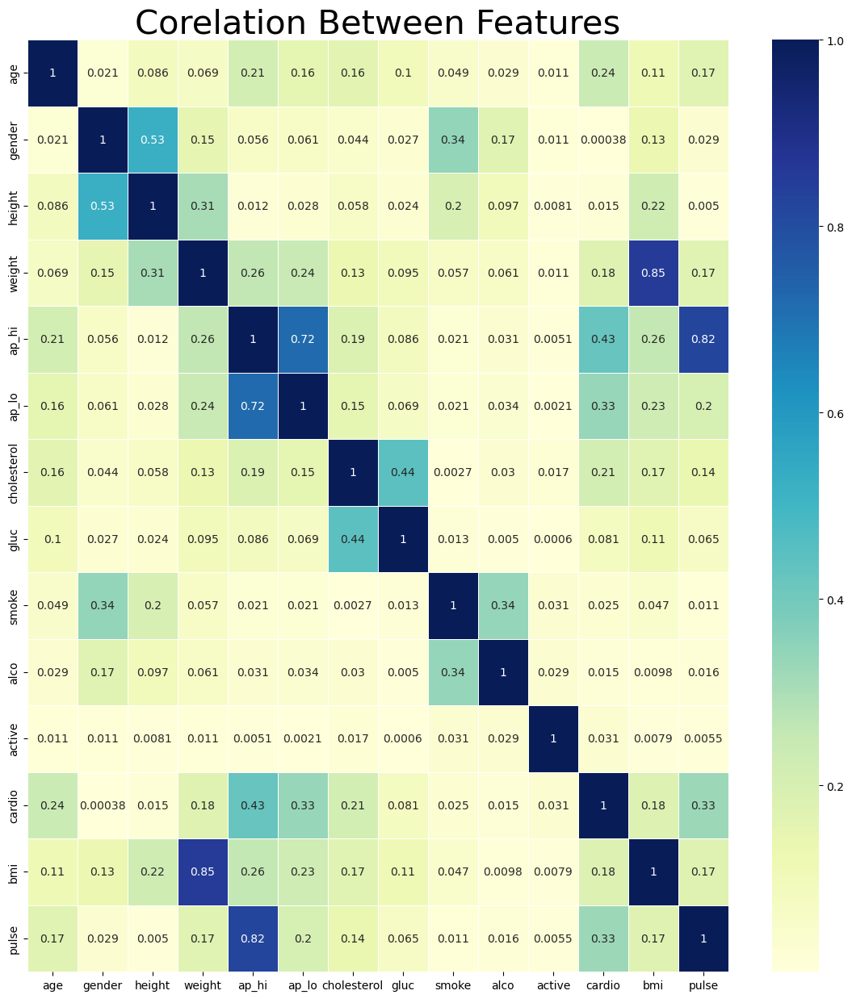

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (14, 15) 
sns.heatmap(np.abs(cleaned_data.corr()), annot = True, linewidths=.5, cmap="YlGnBu")
plt.title('Corelation Between Features', fontsize = 30)
plt.show()


### ap_hi коррелирует со многими признаками но при этом больше всех коррелирует с целевым признаком относительно других также как и пульс с ap_lo
### придется выкинуть имт так как сильно коррелирует с ap_hi но плохо коррелирует с целевым признаком также как и вес
### gender коррилирует с весом ростом курением и алкоголем но совсем не коррилирует с целевым признаком, также плохо коррелируют height, smoke, alco, active

## Выбросим 'ap_lo', 'height', 'gluc', 'gender', 'height', 'smoke', 'alco', 'active'

In [33]:
X = cleaned_data.drop(['cardio', 'ap_lo','pulse', 'height', 'gluc', 'gender', 'smoke', 'alco', 'active'], axis =1)
Y = cleaned_data['cardio']

In [34]:
print(X)

       age    weight  ap_hi  cholesterol        bmi
0       50  4.127134    110            1  21.967120
1       55  4.442651    140            3  34.927679
2       51  4.158883    130            3  23.507805
3       48  4.406719    150            1  28.710479
4       47  4.025352    100            1  23.011177
...    ...       ...    ...          ...        ...
67150   53  4.248495    130            1  23.661439
67151   57  4.382027    150            1  29.384757
67153   52  4.653960    180            3  31.353579
67154   61  4.276666    135            1  27.099251
67155   56  4.276666    120            2  24.913495

[63938 rows x 5 columns]


In [35]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
import matplotlib.pyplot as plt 
plt.rc("font", size=14)
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import seaborn as sns
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)

In [36]:
print(len(cleaned_data[cleaned_data['cardio']==0]))
print(len(cleaned_data[cleaned_data['cardio']==1]))

31534
32404


### Сбалансируем наши данные с помощью алгоритма SMOTE надо про него почитать

### алгоритм SMOTE 
### создаёт синтетические образцы на основе выборок минорного класса (не подписавшихся) вместо создания их копий;
### случайно выбирает одного из ближайших k-соседей и использует его для создания схожих, но случайно изменённых новых сведений.

In [37]:
conda install -c conda-forge imbalanced-learn


Solving environment: ...working... done

# All requested packages already installed.

Retrieving notices: ...working... done

Note: you may need to restart the kernel to use updated packages.




==> WARNING: A newer version of conda exists. <==
  current version: 22.9.0
  latest version: 23.5.0

Please update conda by running

    $ conda update -n base -c defaults conda




In [38]:
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, recall_score
from sklearn.neighbors import NearestNeighbors
from sklearn import metrics

In [39]:
df = cleaned_data.drop(['height', 'gluc', 'gender', 'smoke', 'alco', 'active','ap_lo','pulse'], axis =1)

In [40]:
X = df[['bmi','age','weight','ap_hi','cholesterol']]
y = df['cardio']
X_train,X_test,y_train,y_test = train_test_split (X,y,test_size=0.3,random_state=0) 
print(y_train)

32729    0
7192     0
60431    1
8028     1
10827    1
        ..
47667    0
54671    0
44162    0
45173    0
2738     1
Name: cardio, Length: 44756, dtype: int64


In [41]:
from imblearn.over_sampling import SMOTE

In [42]:
log_regression = LogisticRegression()

#fit the model using the training data
log_regression. fit (X_train,y_train)

#use model to make predictions on test data
y_pred = log_regression. predict (X_test)

In [43]:
cnf_matrix =metrics.confusion_matrix(y_test, y_pred)
print(cnf_matrix)

[[7267 2179]
 [3183 6553]]


#### Истинно положительных предсказаний:7290
#### Истинно отрицательные прогнозы: 6519
#### Ложноположительные прогнозы: 3217
#### Ложноотрицательные прогнозы: 2156
#### TP (True Positives) — верно классифицированные положительные примеры (так называемые истинно положительные случаи).
#### TN (True Negatives) — верно классифицированные отрицательные примеры (истинно отрицательные случаи).
#### FN (False Negatives) — положительные примеры, классифицированные как отрицательные (ошибка I рода). Это так называемый «ложный пропуск» — когда интересующее нас событие ошибочно не обнаруживается (ложно отрицательные примеры).
#### FP (False Positives) — отрицательные примеры, классифицированные как положительные (ошибка II рода). Это ложное обнаружение, т.к. при отсутствии события ошибочно выносится решение о его присутствии (ложно положительные случаи).

In [44]:
print(" Accuracy:",metrics.accuracy_score(y_test, y_pred))

 Accuracy: 0.7204671045772078



### Это говорит нам о том, что модель сделала правильный прогноз относительно того, болен ли человек в 71.9% случаев.

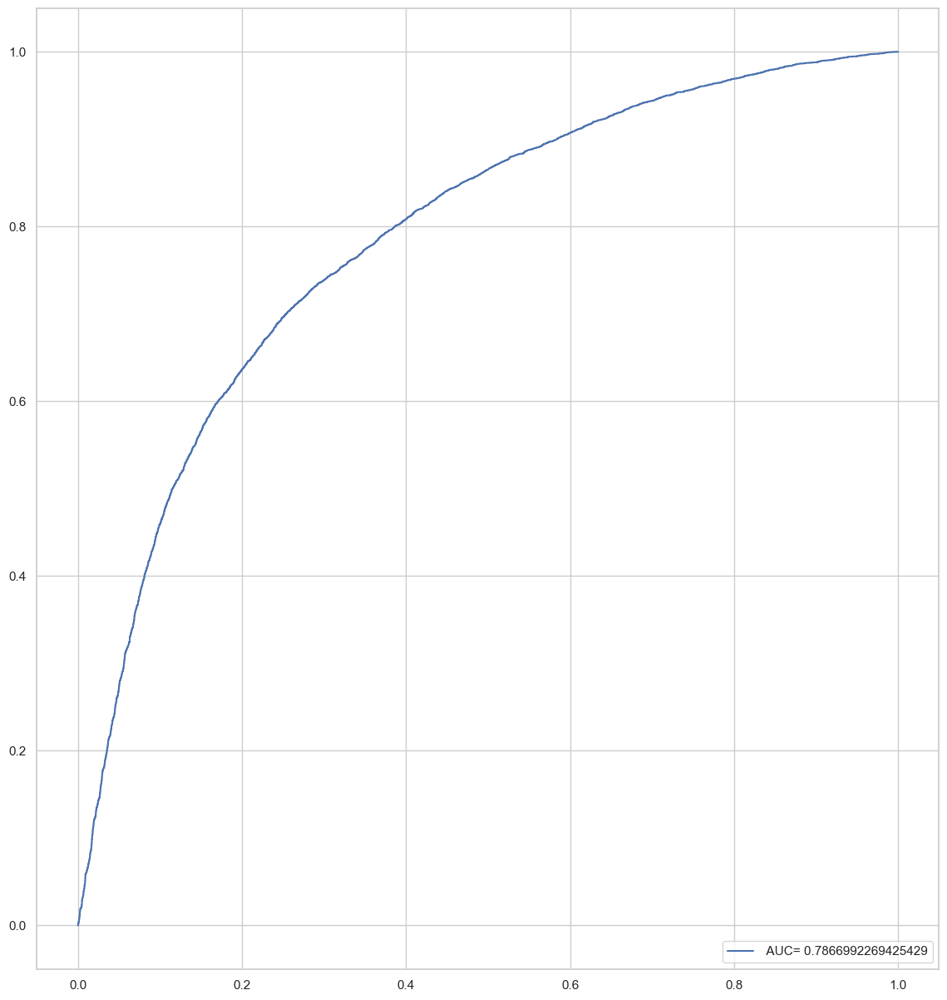

In [45]:
y_pred_proba = log_regression. predict_proba (X_test)[::,1]
fpr, tpr, _ = metrics. roc_curve (y_test, y_pred_proba)
auc = metrics. roc_auc_score (y_test, y_pred_proba)

#create ROC curve
plt.plot (fpr,tpr,label=" AUC= "+str(auc))
plt.legend(loc=4)
plt.show()

In [46]:
### кривую ROC(рабочая характеристика приемника)

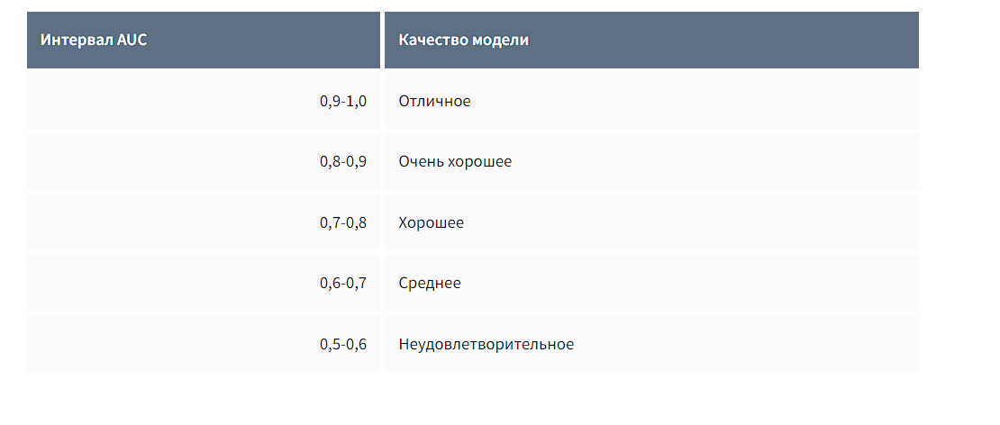

In [47]:
df = cleaned_data.drop(['bmi','pulse','height','ap_lo', 'weight', 'gluc', 'gender', 'smoke', 'alco', 'active'], axis =1)

In [48]:
X = df[['age','ap_hi','cholesterol']]
y = df['cardio']
X_train,X_test,y_train,y_test = train_test_split (X,y,test_size=0.3,random_state=0) 
print(y_train)

32729    0
7192     0
60431    1
8028     1
10827    1
        ..
47667    0
54671    0
44162    0
45173    0
2738     1
Name: cardio, Length: 44756, dtype: int64


In [49]:
log_regression = LogisticRegression()

#fit the model using the training data
log_regression. fit (X_train,y_train)

#use model to make predictions on test data
y_pred = log_regression. predict (X_test)

In [50]:
cnf_matrix =metrics.confusion_matrix(y_test, y_pred)
print(cnf_matrix)

[[7299 2147]
 [3260 6476]]


In [51]:
print(" Accuracy:",metrics.accuracy_score(y_test, y_pred))

 Accuracy: 0.7181211552497133


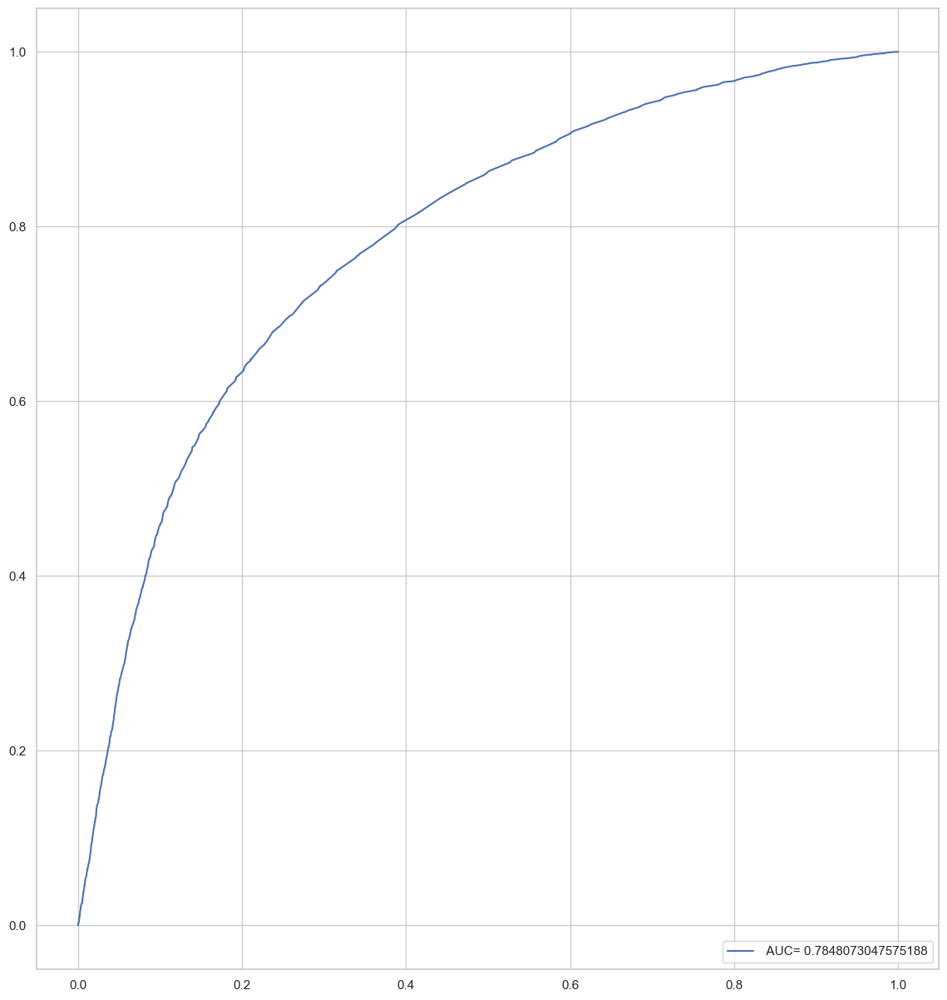

In [52]:
y_pred_proba = log_regression. predict_proba (X_test)[::,1]
fpr, tpr, _ = metrics. roc_curve (y_test, y_pred_proba)
auc = metrics. roc_auc_score (y_test, y_pred_proba)

#create ROC curve
plt.plot (fpr,tpr,label=" AUC= "+str(auc))
plt.legend(loc=4)
plt.show()

In [53]:
print(df)

       age  ap_hi  cholesterol  cardio
0       50    110            1       0
1       55    140            3       1
2       51    130            3       1
3       48    150            1       1
4       47    100            1       0
...    ...    ...          ...     ...
67150   53    130            1       1
67151   57    150            1       1
67153   52    180            3       1
67154   61    135            1       1
67155   56    120            2       0

[63938 rows x 4 columns]


In [54]:
import statistics
keys = ['age','ap_hi','cholesterol','bmi']
df = cleaned_data.drop(['height','weight', 'gluc', 'gender', 'smoke', 'alco', 'active','ap_lo','pulse'], axis =1)
means = []
for key in keys:
    means.append(statistics.mean(df[key])/len(df[key]))
print(means)
for key in keys:
    i = 0
    df[key] -= means[i]
    df[key] =df[key]/np.sqrt(statistics.variance(df[key]))
    i+=1
print(df)

[0.0008266222892948643, 0.0019857231606159225, 2.157694132436223e-05, 0.00043004458850109424]
            age      ap_hi  cholesterol  cardio       bmi
0      7.352323   6.497730     1.451298       0  4.421486
1      8.087567   8.269852     4.356296       1  7.030253
2      7.499372   7.679145     4.356296       1  4.731603
3      7.058225   8.860559     1.451298       1  5.778823
4      6.911176   5.907023     1.451298       0  4.631639
...         ...        ...          ...     ...       ...
67150  7.793470   7.679145     1.451298       1  4.762527
67151  8.381665   8.860559     1.451298       1  5.914545
67153  7.646421  10.632681     4.356296       1  6.310840
67154  8.969861   7.974498     1.451298       1  5.454507
67155  8.234616   7.088438     2.903797       0  5.014547

[63938 rows x 5 columns]


In [55]:
X = df[['bmi','age','ap_hi','cholesterol']]
y = df['cardio']
X_train,X_test,y_train,y_test = train_test_split (X,y,test_size=0.3,random_state=0) 
print(y_train)

32729    0
7192     0
60431    1
8028     1
10827    1
        ..
47667    0
54671    0
44162    0
45173    0
2738     1
Name: cardio, Length: 44756, dtype: int64


In [56]:
log_regression = LogisticRegression()

#fit the model using the training data
log_regression. fit (X_train,y_train)

#use model to make predictions on test data
y_pred = log_regression. predict (X_test)

In [57]:
cnf_matrix =metrics.confusion_matrix(y_test, y_pred)
print(cnf_matrix)

[[7278 2168]
 [3195 6541]]


In [61]:
# получить коэффициенты
coefficients = log_regression.coef_

# получить свободный член
intercept = log_regression.intercept_
print(coefficients,intercept)
for i, col in enumerate(X_train.columns):
    print(f'{coefficients[0][i]} * {col}')

[[0.12643037 0.32299297 1.01848957 0.28846497]] [-11.3377771]
0.1264303691671793 * bmi
0.322992972238653 * age
1.0184895659648068 * ap_hi
0.2884649721699835 * cholesterol


In [58]:
print(" Accuracy:",metrics.accuracy_score(y_test, y_pred))

 Accuracy: 0.7204149723699301


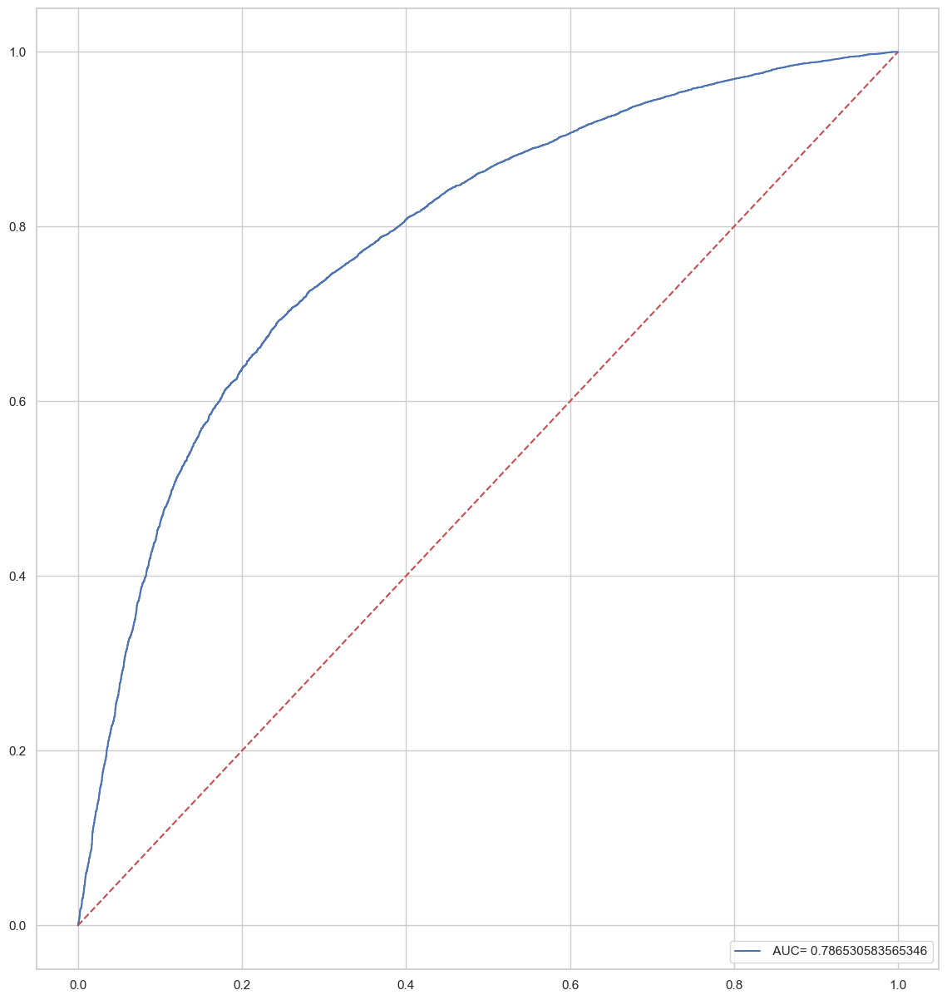

In [60]:
y_pred_proba = log_regression. predict_proba (X_test)[::,1]
fpr, tpr, _ = metrics. roc_curve (y_test, y_pred_proba)
auc = metrics. roc_auc_score (y_test, y_pred_proba)

#create ROC curve
plt.plot (fpr,tpr,label=" AUC= "+str(auc))
plt.plot([0, 1], [0, 1],'r--')
plt.legend(loc=4)
plt.show()

[[6406 1390]
 [2610 3782]]
[[0.13662334 0.38842152 1.06636828]] [-12.27486324]
0.13662333538452018 * bmi
0.3884215195514448 * age
1.0663682845741547 * ap_hi
 Accuracy: 0.718071609811108


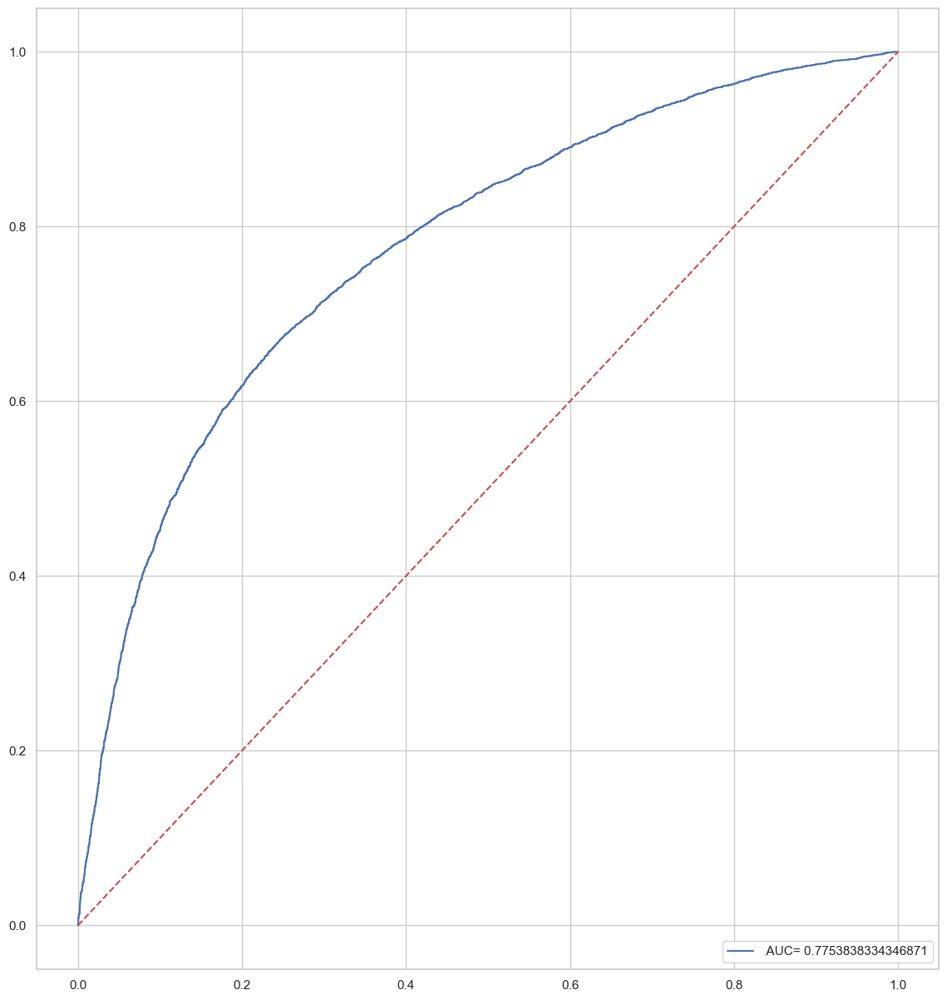

[[ 682  421]
 [ 341 1263]]
[[0.10172489 0.16360605 1.07690023]] [-8.66809781]
0.10172488975178956 * bmi
0.1636060491481961 * age
1.076900228641717 * ap_hi
 Accuracy: 0.7185075729589951


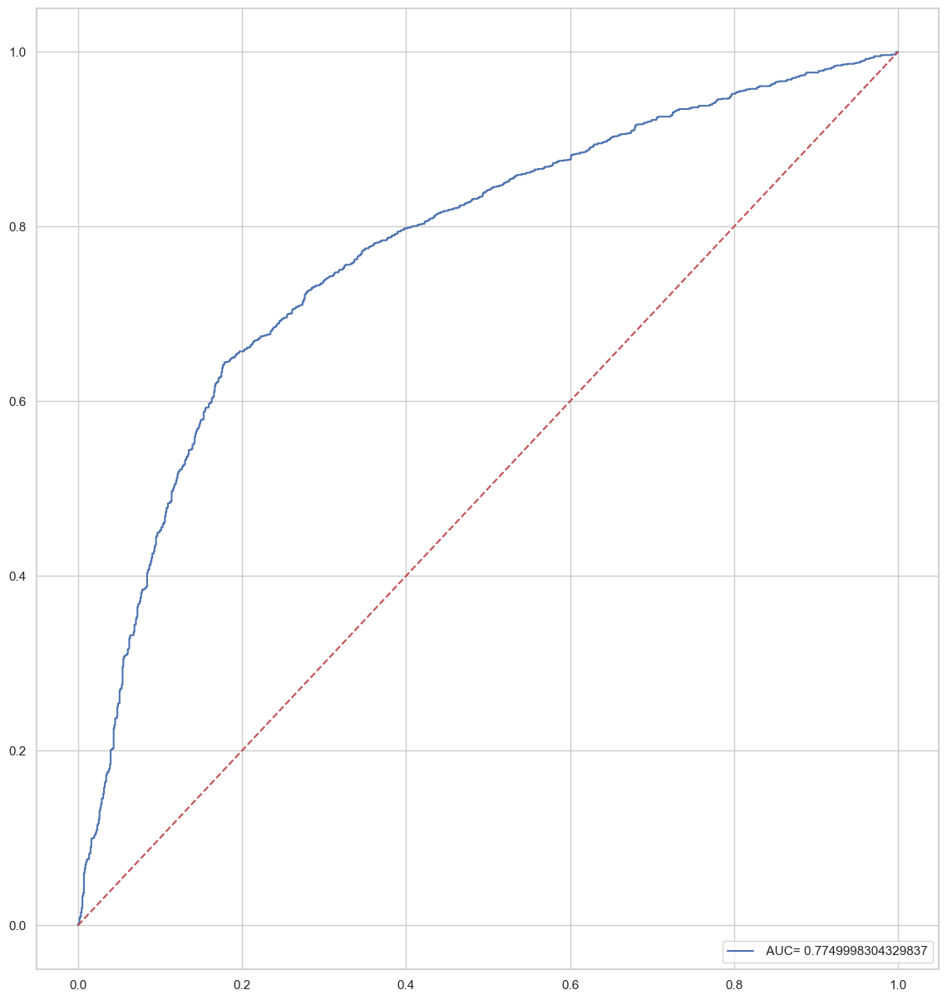

[[  13  532]
 [   4 1739]]
[[0.20247565 0.16198703 0.41530598]] [-4.68860428]
0.20247564505000107 * bmi
0.1619870317380338 * age
0.4153059848272102 * ap_hi
 Accuracy: 0.7657342657342657


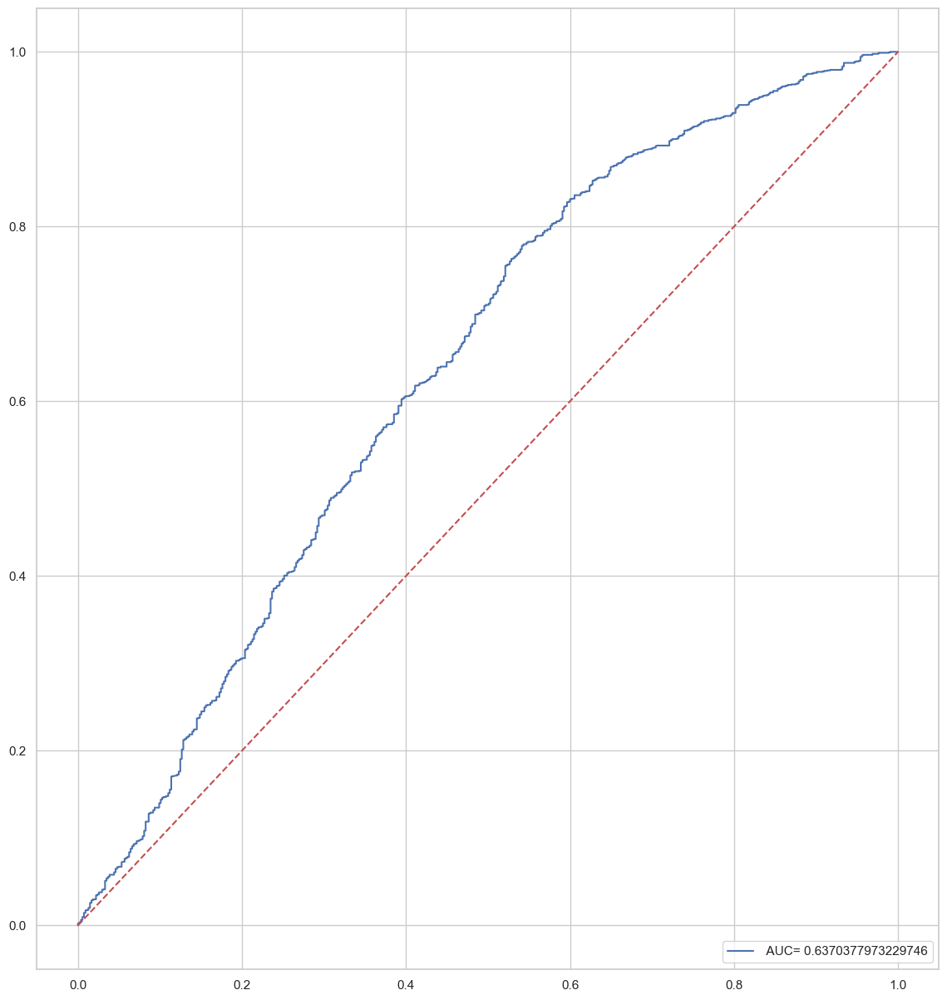

In [73]:
import statistics
keys = ['age','ap_hi','bmi']
df = cleaned_data.drop(['height','weight', 'gluc', 'gender', 'smoke', 'alco', 'active','ap_lo','pulse'], axis =1)
df1 = df[df['cholesterol']==1]
df2 = df[df['cholesterol']==2]
df3 = df[df['cholesterol']==3]
dfs = [df1,df2,df3]
means = []
for df_ in dfs:
    df_ =df_.drop(['cholesterol'],axis =1)
    means = []
    for key in keys:
        means.append(statistics.mean(df_[key])/len(df_[key]))
    for key in keys:
        i = 0
        df_[key] -= means[i]
        df_[key] =df_[key]/np.sqrt(statistics.variance(df_[key]))
        i+=1
        
    X = df_[['bmi','age','ap_hi',]]
    y = df_['cardio']
    X_train,X_test,y_train,y_test = train_test_split (X,y,test_size=0.3,random_state=0) 
    
    log_regression = LogisticRegression()
    #fit the model using the training data
    log_regression. fit (X_train,y_train)
    #use model to make predictions on test data
    y_pred = log_regression. predict (X_test)
    
    cnf_matrix =metrics.confusion_matrix(y_test, y_pred)
    print(cnf_matrix)
    
    coefficients = log_regression.coef_
    # получить свободный член
    intercept = log_regression.intercept_
    print(coefficients,intercept)
    for i, col in enumerate(X_train.columns):
        print(f'{coefficients[0][i]} * {col}')
        
    print(" Accuracy:",metrics.accuracy_score(y_test, y_pred))
    
    y_pred_proba = log_regression. predict_proba (X_test)[::,1]
    fpr, tpr, _ = metrics. roc_curve (y_test, y_pred_proba)
    auc = metrics. roc_auc_score (y_test, y_pred_proba)

    #create ROC curve
    plt.plot (fpr,tpr,label=" AUC= "+str(auc))
    plt.plot([0, 1], [0, 1],'r--')
    plt.legend(loc=4)
    plt.show()